In [1]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.units as munits
import numpy as np

# the following code lines are necessary to import custom module
import os
import sys

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

from src.models.forecasting import QRHyperoptTS

# Forecasting Lapa station temperature

In [2]:
# df_binary_features = pd.read_csv("../data/processed/df_binary_features.csv")
# df_binary_features = df_binary_features.dropna()
# df_binary_features = df_binary_features.drop(["month", "season", "uhi_outlier"], axis=1)

df_continuous_features = pd.read_csv("../data/processed/df_continuous_features.csv")
df_continuous_features = df_continuous_features.dropna(axis=1, how="all")
df_continuous_features = df_continuous_features.dropna()
df_continuous_features

,timestamp,station,precipitation,temperature,relative_humidity,pressure,precipitation_rural,temperature_rural,relative_humidity_rural,pressure_rural,...,wind_blow_y_window_23H_min,wind_blow_y_window_23H_max,wind_blow_x_rural_window_23H_mean,wind_blow_x_rural_window_23H_std,wind_blow_x_rural_window_23H_min,wind_blow_x_rural_window_23H_max,wind_blow_y_rural_window_23H_mean,wind_blow_y_rural_window_23H_std,wind_blow_y_rural_window_23H_min,wind_blow_y_rural_window_23H_max
23,2016-01-22 13:00:00,1000848,0.0,22.507833,70.349833,935.693333,0.25,19.385667,87.755167,926.856667,...,0.973122,4.374810,-0.946645,1.809719,-5.475402,2.231422,-3.384126,1.665930,-6.892774,-0.498039
24,2016-01-22 14:00:00,1000848,0.0,22.818000,70.023333,935.545000,0.25,20.575667,85.224000,926.358333,...,0.973122,4.374810,-0.732929,1.587197,-5.475402,2.231422,-3.426969,1.697158,-6.892774,-0.498039
25,2016-01-22 15:00:00,1000848,0.0,23.602000,68.897167,935.361667,0.25,20.585500,84.750167,926.343333,...,0.973122,4.374810,-0.551610,1.464069,-5.475402,2.231422,-3.448718,1.714303,-6.892774,-0.498039
26,2016-01-22 16:00:00,1000848,0.0,23.912667,67.558333,934.646667,0.25,20.980333,82.869000,925.648333,...,0.973122,4.374810,-0.360137,1.007705,-2.676657,2.231422,-3.512198,1.742165,-6.892774,-0.498039
27,2016-01-22 17:00:00,1000848,0.0,23.583667,69.319333,934.471667,0.25,19.978167,87.785667,926.036667,...,0.973122,4.815891,-0.464017,1.143491,-2.951533,2.231422,-3.534133,1.764224,-6.892774,-0.498039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26966,2019-02-18 04:00:00,1000848,0.0,20.755167,94.796000,930.720000,3.00,19.541833,99.993000,922.203333,...,-6.392027,0.000000,0.524003,1.500809,-2.464878,2.525920,-0.466983,0.903049,-1.957888,1.153268
26967,2019-02-18 05:00:00,1000848,0.0,20.296833,95.171167,930.793333,3.00,19.075167,99.993000,921.408333,...,-6.392027,0.000000,0.537139,1.498140,-2.464878,2.525920,-0.409104,0.932824,-1.957888,1.153268
26968,2019-02-18 06:00:00,1000848,0.0,20.218333,96.038000,930.733333,3.00,18.960833,99.993000,920.798333,...,-6.392027,0.000000,0.524578,1.497486,-2.464878,2.525920,-0.340274,0.960652,-1.957888,1.153268
26969,2019-02-18 07:00:00,1000848,0.0,20.084000,96.117500,930.711667,3.00,18.695667,99.993000,920.541667,...,-6.392027,0.000000,0.550304,1.500034,-2.464878,2.525920,-0.325380,0.962122,-1.957888,1.153268


In [3]:
ts = df_continuous_features[["timestamp"]]
ts.head()

,timestamp
23,2016-01-22 13:00:00
24,2016-01-22 14:00:00
25,2016-01-22 15:00:00
26,2016-01-22 16:00:00
27,2016-01-22 17:00:00


In [4]:
def make_steps(df, y, steps):
    for i in range(steps):
        df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
    return df

steps = 6
y = make_steps(df=df_continuous_features[["uhi"]], y="uhi", steps=steps).drop("uhi", axis=1)
y = y.dropna()

y

/tmp/ipykernel_1374/1754686210.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
/tmp/ipykernel_1374/1754686210.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
/tmp/ipykernel_1374/1754686210.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

,uhi_step_1,uhi_step_2,uhi_step_3,uhi_step_4,uhi_step_5,uhi_step_6
24,3.122167,2.242333,3.016500,2.932333,3.605500,2.823333
25,2.242333,3.016500,2.932333,3.605500,2.823333,2.289833
26,3.016500,2.932333,3.605500,2.823333,2.289833,2.407167
27,2.932333,3.605500,2.823333,2.289833,2.407167,2.400333
28,3.605500,2.823333,2.289833,2.407167,2.400333,2.776667
...,...,...,...,...,...,...
26962,2.924167,2.296167,1.732167,1.735667,1.764333,1.213333
26963,2.296167,1.732167,1.735667,1.764333,1.213333,1.221667
26964,1.732167,1.735667,1.764333,1.213333,1.221667,1.257500
26965,1.735667,1.764333,1.213333,1.221667,1.257500,1.388333


In [5]:
# X_binary_features = df_binary_features.drop(["timestamp"], axis=1)
# X_binary_features = X_binary_features.loc[y.index.min():y.index.max()]
# X_binary_features

In [6]:
X_continuous_features = df_continuous_features.drop(["timestamp", "station", "station_name", "precipitation", "temperature", "relative_humidity", "pressure", "wind_velocity_x", "wind_velocity_y", "wind_blow_x", "wind_blow_y"], axis=1)
X_continuous_features = X_continuous_features.loc[y.index.min():y.index.max()]
X_continuous_features

,precipitation_rural,temperature_rural,relative_humidity_rural,pressure_rural,uhi,wind_velocity_x_rural,wind_velocity_y_rural,wind_blow_x_rural,wind_blow_y_rural,month_sin,...,wind_blow_y_window_23H_min,wind_blow_y_window_23H_max,wind_blow_x_rural_window_23H_mean,wind_blow_x_rural_window_23H_std,wind_blow_x_rural_window_23H_min,wind_blow_x_rural_window_23H_max,wind_blow_y_rural_window_23H_mean,wind_blow_y_rural_window_23H_std,wind_blow_y_rural_window_23H_min,wind_blow_y_rural_window_23H_max
24,0.25,20.575667,85.224000,926.358333,2.242333,0.186164,-2.235380,0.451933,-4.974117,0.500000,...,0.973122,4.374810,-0.732929,1.587197,-5.475402,2.231422,-3.426969,1.697158,-6.892774,-0.498039
25,0.25,20.585500,84.750167,926.343333,3.016500,-0.699666,-2.414394,-1.071540,-4.936030,0.500000,...,0.973122,4.374810,-0.551610,1.464069,-5.475402,2.231422,-3.448718,1.714303,-6.892774,-0.498039
26,0.25,20.980333,82.869000,925.648333,2.932333,-1.343305,-2.215995,-2.951533,-5.461925,0.500000,...,0.973122,4.374810,-0.360137,1.007705,-2.676657,2.231422,-3.512198,1.742165,-6.892774,-0.498039
27,0.25,19.978167,87.785667,926.036667,3.605500,-0.346515,-1.995269,-0.846513,-5.184511,0.500000,...,0.973122,4.815891,-0.464017,1.143491,-2.951533,2.231422,-3.534133,1.764224,-6.892774,-0.498039
28,0.25,19.981667,85.780333,925.701667,2.823333,-1.367635,-3.236160,-2.494730,-5.768386,0.500000,...,0.973122,4.815891,-0.511467,1.135354,-2.951533,2.231422,-3.459860,1.648568,-5.935413,-0.498039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26962,3.00,19.766667,99.979833,922.246667,2.296167,-0.014681,0.060923,-0.351540,0.043818,0.866025,...,-6.392027,0.000000,0.304875,1.727630,-2.464878,2.525920,-0.641966,0.793138,-1.957888,1.153268
26963,3.00,19.771667,99.993000,922.950000,1.732167,-0.006808,0.030585,-0.112178,0.520712,0.866025,...,-6.392027,0.000000,0.396348,1.627640,-2.464878,2.525920,-0.603589,0.804452,-1.957888,1.153268
26964,3.00,19.704667,99.993000,923.000000,1.735667,-0.019455,0.091965,-0.071878,0.337084,0.866025,...,-6.392027,0.000000,0.494908,1.516799,-2.464878,2.525920,-0.547623,0.836731,-1.957888,1.153268
26965,3.00,19.528167,99.993000,922.770000,1.764333,0.000000,0.000000,0.090741,0.930065,0.866025,...,-6.392027,0.000000,0.519023,1.502501,-2.464878,2.525920,-0.508307,0.856775,-1.957888,1.153268


In [7]:
ts = ts.loc[y.index.min():y.index.max()]
ts

,timestamp
24,2016-01-22 14:00:00
25,2016-01-22 15:00:00
26,2016-01-22 16:00:00
27,2016-01-22 17:00:00
28,2016-01-22 18:00:00
...,...
26962,2019-02-18 00:00:00
26963,2019-02-18 01:00:00
26964,2019-02-18 02:00:00
26965,2019-02-18 03:00:00


In [8]:
# the following code lines are necessary to import custom module
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.multioutput import RegressorChain
from sklearn.ensemble import HistGradientBoostingRegressor, RandomForestRegressor

from sklearn.linear_model import (LassoCV, RidgeCV, TweedieRegressor, RANSACRegressor, 
                                  TheilSenRegressor, HuberRegressor, PassiveAggressiveRegressor,
                                  ElasticNetCV, BayesianRidge, QuantileRegressor)

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV, HalvingGridSearchCV

scaler = StandardScaler()
scaler.fit(X_continuous_features)
X_standard_continuous_features = scaler.transform(X_continuous_features)

test_size = 0.30
X_train_ref, X_test_ref, _, _ = train_test_split(X_continuous_features, y, test_size=0.30, shuffle=False)
X_train, X_test, y_train, y_test = train_test_split(X_standard_continuous_features, y, test_size=test_size, shuffle=False)

In [9]:
# X_train = pd.DataFrame(X_train, columns=X_train_ref.columns, index=X_train_ref.index)
# X_train = X_train.merge(X_binary_features, left_index=True, right_index=True)

# X_test = pd.DataFrame(X_test, columns=X_test_ref.columns, index=X_test_ref.index)
# X_test = X_test.merge(X_binary_features, left_index=True, right_index=True)

In [10]:
gb = RegressorChain(
    base_estimator=HalvingGridSearchCV(
        estimator=HistGradientBoostingRegressor(random_state=123),
        param_grid = {
            "max_depth": np.arange(10, 40, 10, dtype=int),
            "learning_rate": np.logspace(-3, -1, 3)
        },
        cv=TimeSeriesSplit(n_splits=3, test_size=2000),
        aggressive_elimination=True,
        scoring="neg_mean_squared_error",
        random_state=123,
        n_jobs=-1
    ),
    random_state=123
)

mlp = RegressorChain(
    base_estimator=HalvingGridSearchCV(
        estimator=MLPRegressor(max_iter=1000, random_state=123),
        param_grid = {
            "hidden_layer_sizes": [(100,), (100, 75, 25)],
            "activation": ["identity", "logistic", "tanh", "relu"]
        },
        cv=TimeSeriesSplit(n_splits=3, test_size=2000),
        aggressive_elimination=True,
        scoring="neg_mean_squared_error",
        random_state=123,
        n_jobs=-1
    ),
    random_state=123
)

rid = RegressorChain(
    base_estimator=RidgeCV(
        alphas=[1e-3, 1e-2, 1e-1, 1],
        cv=TimeSeriesSplit(n_splits=3, test_size=2000),
    ),
    random_state=123
)

models = {
    "mlp": mlp,
    "gb": gb,
    "rid": rid
}

models["rid"].fit(X_train, y_train)

RegressorChain(base_estimator=RidgeCV(alphas=[0.001, 0.01, 0.1, 1],
                                      cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=3, test_size=2000)),
               random_state=123)

In [11]:
y_pred = pd.DataFrame(models["rid"].predict(X_test), index=X_test_ref.index, columns=y.columns)

<AxesSubplot:>

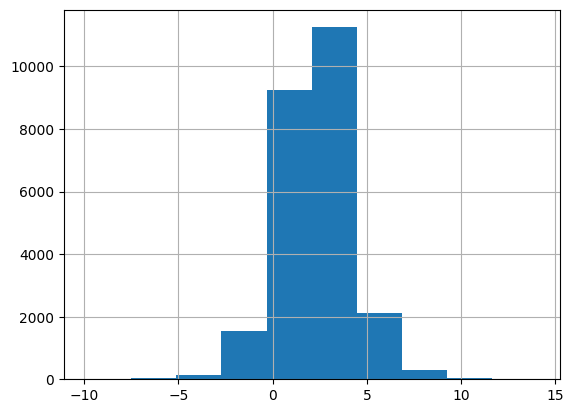

In [12]:
df_continuous_features.uhi.hist()

<AxesSubplot:xlabel='timestamp'>

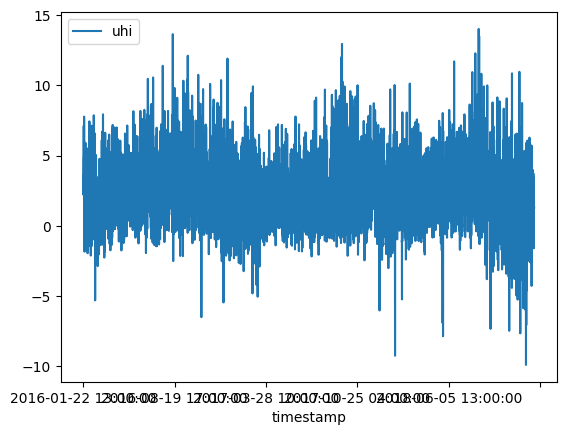

In [13]:
df_continuous_features[["timestamp", "uhi"]].set_index("timestamp").plot()

<AxesSubplot:xlabel='timestamp'>

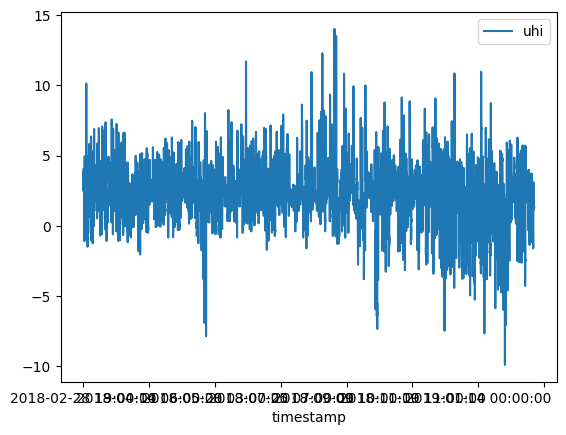

In [14]:
test = df_continuous_features[X_test_ref.index[0]:X_test_ref.index[-1]][["timestamp", "uhi"]].set_index("timestamp")
test.plot()

In [15]:
test.index = pd.to_datetime(test.index)
test

,uhi
timestamp,
2018-02-28 19:00:00,4.013667
2018-02-28 20:00:00,2.502833
2018-02-28 21:00:00,3.209500
2018-02-28 22:00:00,3.786667
2018-02-28 23:00:00,3.770167
...,...
2019-02-18 04:00:00,1.213333
2019-02-18 05:00:00,1.221667
2019-02-18 06:00:00,1.257500


In [16]:
ts.timestamp = pd.to_datetime(ts.timestamp)
y_pred["timestamp"] = ts[y_pred.index[0]:y_pred.index[-1]]["timestamp"]
y_pred = y_pred.dropna()
y_pred

,uhi_step_1,uhi_step_2,uhi_step_3,uhi_step_4,uhi_step_5,uhi_step_6,timestamp
18462,4.006749,2.502833,2.236004,2.778665,2.991514,3.056653,2018-02-28 20:00:00
18463,2.510446,3.209500,3.967745,3.692090,3.622875,3.478530,2018-02-28 21:00:00
18464,3.214624,3.786666,3.338883,3.554017,3.817735,3.725294,2018-02-28 22:00:00
18465,3.803629,3.770166,3.483332,3.474904,3.459985,3.382650,2018-02-28 23:00:00
18466,3.768288,3.531667,3.387055,3.406549,3.363939,3.307687,2018-03-01 00:00:00
...,...,...,...,...,...,...,...
26962,2.918904,2.296167,1.778316,1.890250,1.791644,1.617810,2019-02-18 00:00:00
26963,2.302419,1.732167,1.604051,1.450993,1.360366,1.297217,2019-02-18 01:00:00
26964,1.737226,1.735667,1.560453,1.359019,1.324794,1.553448,2019-02-18 02:00:00
26965,1.748349,1.764333,1.275604,0.955255,1.234665,1.310751,2019-02-18 03:00:00


/tmp/ipykernel_1374/2008095227.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(9,3))


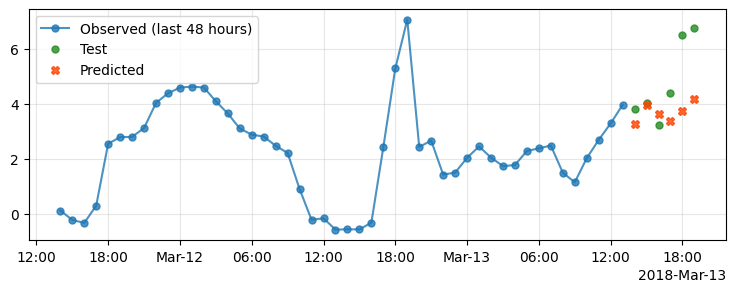

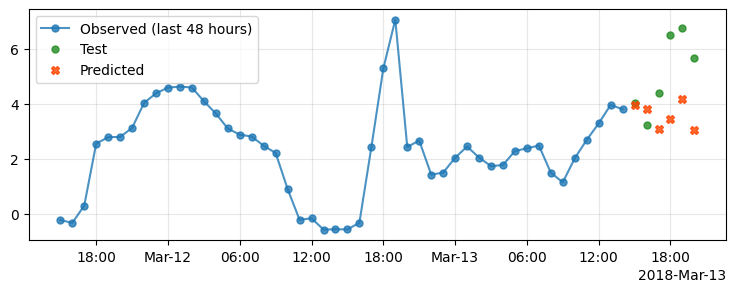

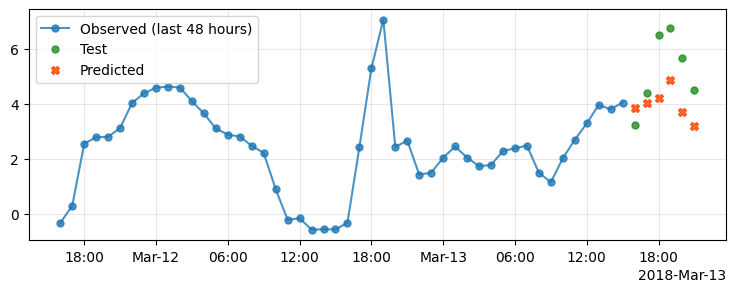

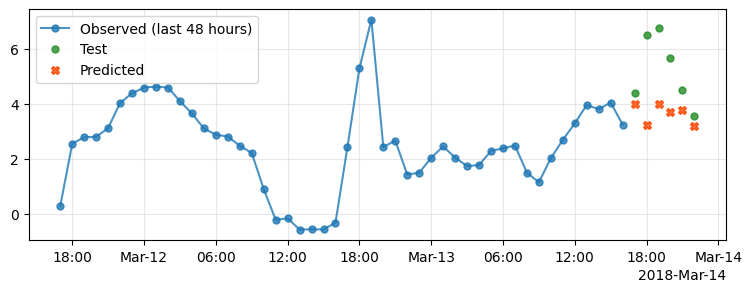

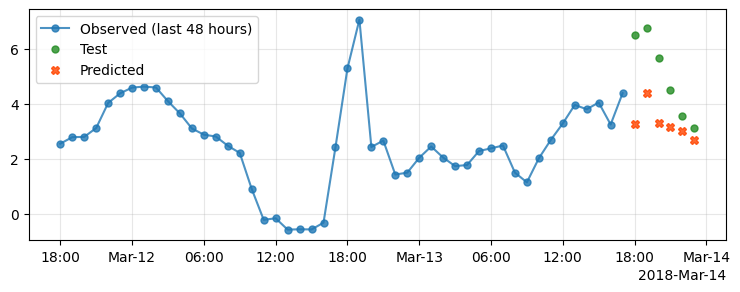

...

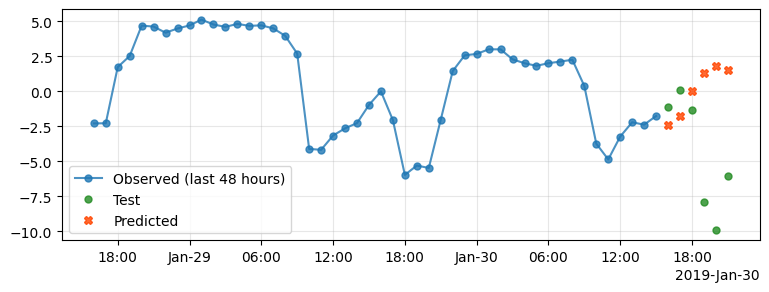

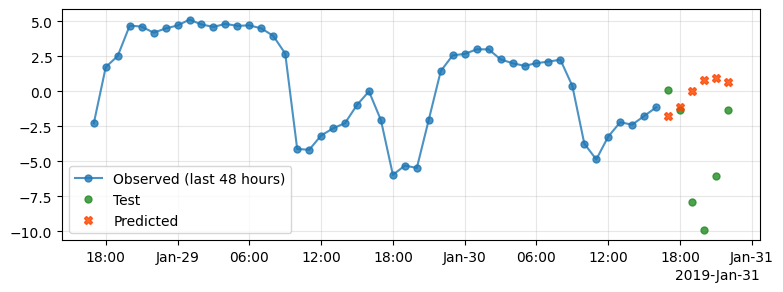

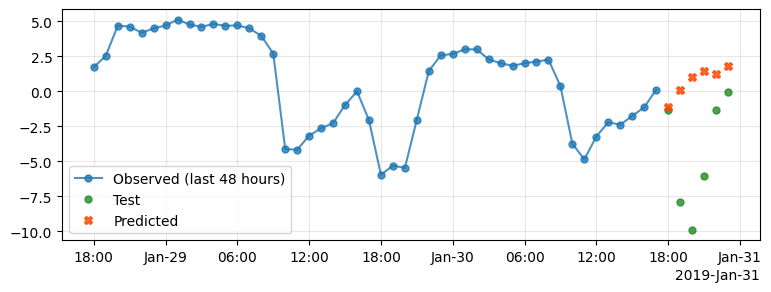

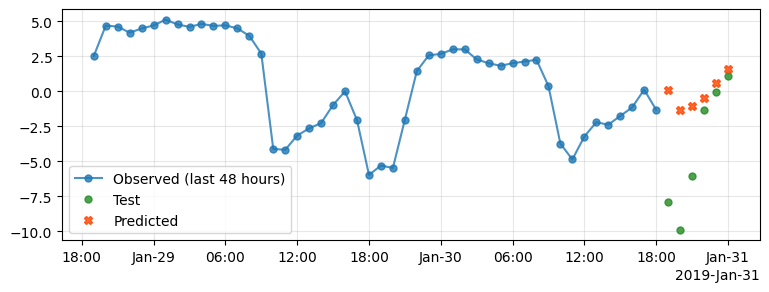

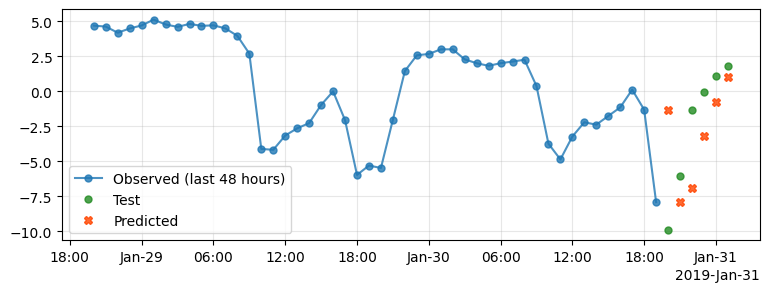

In [17]:
converter = mdates.ConciseDateConverter()
munits.registry[np.datetime64] = converter
munits.registry[datetime.date] = converter
munits.registry[datetime.datetime] = converter

for i in y_pred.index:
    pred = y_pred.loc[[i]]
    start_date = pred.timestamp.unique()[0] + np.timedelta64(1,'h')
    pred = pred.drop("timestamp", axis=1).T
    pred.index = pd.date_range(start=start_date, periods=steps, freq="H")
    pred.columns = ["uhi"]
    past_data = 48
    train_plot = test[pred.index[0]-np.timedelta64(past_data,'h'):pred.index[0]-np.timedelta64(1,'h')]
    test_plot = test[pred.index[0]:pred.index[-1]]
    if sum(test_plot.uhi > 6) > 1 or sum(test_plot.uhi < -6) > 1:
        fig, ax = plt.subplots(figsize=(9,3))
        ax.plot(train_plot, label=f"Observed (last {past_data} hours)", marker=".", markersize=10, alpha=0.8)
        ax.plot(test_plot, label="Test", ls="", marker=".", markersize=10, color="forestgreen", alpha=0.8)
        ax.plot(pred, label="Predicted", ls="", marker="X", markersize=6, color="orangered", alpha=0.8)
        ax.legend()
        ax.grid(alpha=0.3)

In [18]:
test_dfs = []
pred_dfs = []
mse = []
for i in y_pred.index:
    pred = y_pred.loc[[i]]
    start_date = pred.timestamp.unique()[0] + np.timedelta64(1,'h')
    pred = pred.drop("timestamp", axis=1).T
    pred.index = pd.date_range(start=start_date, periods=steps, freq="H")
    pred.columns = ["uhi"]
    test_plot = test[pred.index[0]:pred.index[-1]]
    try:
        mse.append(mean_squared_error(test_plot, pred, squared=False))
        test_dfs.append(test_plot)
        pred_dfs.append(pred)
    except:
        pass

In [19]:
print(f"MSE")
print(f"Mean: {np.round(np.mean(mse), 2)}") 
print(f"Standard deviation: +-{np.round(np.std(mse), 2)}")

MSE
Mean: 1.42
Standard deviation: +-1.1


In [20]:
df_continuous_features.uhi.std()

1.835777187728608